<a href="https://colab.research.google.com/github/jono-vision/fastai_coursework/blob/main/amazon_multicat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 7.5MB/s 
     |████████████████████████████████| 1.1MB 15.8MB/s 
     |████████████████████████████████| 194kB 29.5MB/s 
     |████████████████████████████████| 51kB 8.7MB/s 
     |████████████████████████████████| 61kB 9.6MB/s 
Mounted at /content/gdrive


In [ ]:
#hide
from fastbook import *

In [ ]:
path = Path('/content/gdrive/MyDrive/planet-understanding-the-amazon-from-space')

In [ ]:
%cd gdrive/MyDrive/planet-understanding-the-amazon-from-space

/content/gdrive/MyDrive/planet-understanding-the-amazon-from-space


####Extract Data

In [ ]:
!7z e train-jpg.tar.7z


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 629296207 bytes (601 MiB)

Extracting archive: train-jpg.tar.7z
--
Path = train-jpg.tar.7z
Type = 7z
Physical Size = 629296207
Headers Size = 98
Method = LZMA2:24
Solid = -
Blocks = 1

  0%      0% - train-jpg.tar                      1% - train-jpg.tar                      2% - train-jpg.tar                      3% - train-jpg.tar                      4% - train-jpg.tar                      5% - train-jpg.tar                      6% - train-jpg.tar    

In [ ]:
 !tar -xf train-jpg.tar

In [ ]:
!7z e test-jpg.tar.7z


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 632362315 bytes (604 MiB)

Extracting archive: test-jpg.tar.7z
--
Path = test-jpg.tar.7z
Type = 7z
Physical Size = 632362315
Headers Size = 98
Method = LZMA2:24
Solid = -
Blocks = 1

  0%      0% - test-jpg.tar                     1% - test-jpg.tar                     2% - test-jpg.tar                     3% - test-jpg.tar                     4% - test-jpg.tar                     5% - test-jpg.tar                     6% - test-jpg.tar                   

In [ ]:
 !tar -xf test-jpg.tar

In [ ]:
Path.BASE_PATH = path

In [ ]:
path.ls()

(#12) [Path('test_v2_file_mapping.csv'),Path('train_v2.csv'),Path('.ipynb_checkpoints'),Path('train-jpg.tar.7z'),Path('train-jpg.tar'),Path('train-jpg'),Path('models'),Path('test-jpg.tar.7z'),Path('export.pkl'),Path('submission_file.csv')...]

In [ ]:
(path/'train-jpg').ls()

OSError: ignored

In [ ]:
(path/'test-jpg').ls()

(#40669) [Path('test-jpg/test_20536.jpg'),Path('test-jpg/test_6844.jpg'),Path('test-jpg/test_21149.jpg'),Path('test-jpg/test_25385.jpg'),Path('test-jpg/test_7592.jpg'),Path('test-jpg/test_13398.jpg'),Path('test-jpg/test_37117.jpg'),Path('test-jpg/test_7576.jpg'),Path('test-jpg/test_19857.jpg'),Path('test-jpg/test_18813.jpg')...]

####Create Dataframe

In [ ]:
train_df = pd.read_csv(path/'train_v2.csv')

In [ ]:
train_df.head()

,image_name,tags
0,train_0,haze primary
1,train_1,agriculture clear primary water
2,train_2,clear primary
3,train_3,clear primary
4,train_4,agriculture clear habitation primary road


#### Inspect the images
The images in the dataset are in CYMK color mode which causes PIL to throw an error. As a result we use the `.convert('RGB')` method 

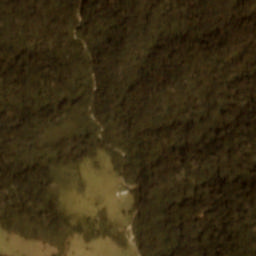

In [ ]:
Image.open(path/'train-jpg'/'train_4.jpg').convert('RGB')

#### Construct DataBlock
x: path of each image

y: label of each image


In [ ]:
def get_x(r):
  return path / 'train-jpg' / (r.image_name + '.jpg')

def get_y(r):
  return (r.tags).split(' ')

dblock = DataBlock(get_x=get_x,get_y=get_y)
dsets = dblock.datasets(train_df)
dsets.train[0]

(Path('train-jpg/train_20862.jpg'),
 ['agriculture', 'clear', 'cultivation', 'habitation', 'primary', 'road'])

##### Check to make sure label is correct

        image_name                                   tags
31678  train_31678  agriculture clear cultivation primary


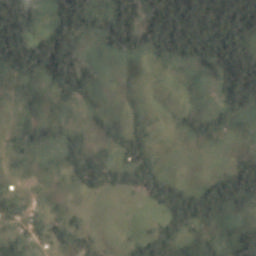

In [ ]:
print(train_df[train_df.image_name=='train_31678'])
Image.open(path/'train-jpg'/'train_31678.jpg').convert('RGB')

In [ ]:
dblock = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   get_x = get_x,
                   get_y = get_y,
                   item_tfms = RandomResizedCrop(128, min_scale=0.35))
dsets = dblock.datasets(train_df)
dsets.train[0]

In [ ]:
len(dsets.train[0][1])

17

In [ ]:
dsets.train.vocab

['agriculture', 'artisinal_mine', 'bare_ground', 'blooming', 'blow_down', 'clear', 'cloudy', 'conventional_mine', 'cultivation', 'habitation', 'haze', 'partly_cloudy', 'primary', 'road', 'selective_logging', 'slash_burn', 'water']

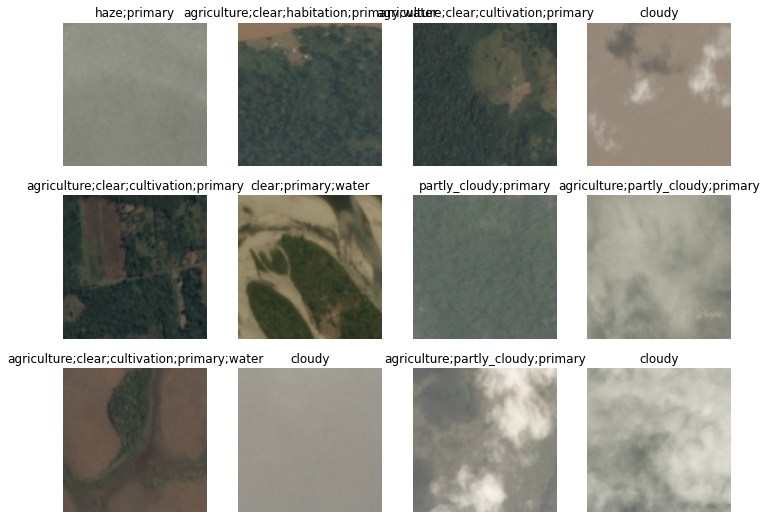

In [ ]:
dls = dblock.dataloaders(train_df)
dls.show_batch(nrows=3, ncols=4,max_n=12)

####Create Learner

In [ ]:
learn = cnn_learner(dls, resnet50, metrics=partial(accuracy_multi, thresh=0.5))
learn.fine_tune(3, base_lr=3e-3, freeze_epochs=2)

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.191564,0.139072,0.949017,03:19
1,0.137603,0.118000,0.956357,03:19


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.120611,0.109314,0.960179,03:32
1,0.109665,0.099858,0.963463,03:34
2,0.100444,0.094401,0.964684,03:33


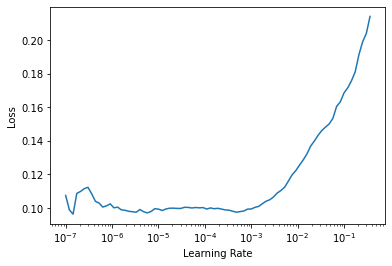

In [ ]:
lr_min,lr_steep = learn.lr_find()

In [ ]:
print(f"Minimum/10: {lr_min:.2e}, steepest point: {lr_steep:.2e}")

Minimum/10: 5.75e-07, steepest point: 9.12e-07


In [ ]:
learn.fine_tune(2, base_lr=9.5e-5)

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.103017,0.094078,0.964553,03:22


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.099477,0.093478,0.964866,03:36
1,0.096486,0.093374,0.964931,03:35


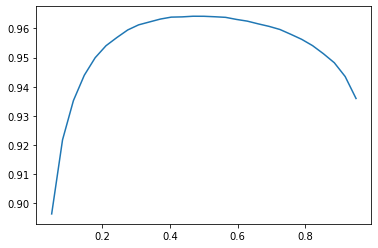

In [ ]:
preds,targs = learn.get_preds()
xs = torch.linspace(0.05,0.95,29)
accs = [accuracy_multi(preds, targs, thresh=i, sigmoid=False) for i in xs]
plt.plot(xs,accs);

####Export learner

In [ ]:
learn.save('amazon_01')

Path('models/amazon_01.pth')

In [ ]:
learn.export()

In [ ]:
def get_x(r):
  return path / 'train-jpg' / (r.image_name + '.jpg')

def get_y(r):
  return (r.tags).split(' ')
  
dblock = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   get_x = get_x,
                   get_y = get_y,
                   item_tfms = RandomResizedCrop(128, min_scale=0.35))

In [ ]:
learn = load_learner(path/'export.pkl')

####Predict using the test images
Colab times out before I could get this to finish writing. If I could figure out a way to write the predictions to csv in a more efficient fashion then an output csv could be created. For the purpose of learning multi-category classification I decided not to spend too much time on figuring this part out.

In [ ]:
images = (path/'test-jpg').ls()
with open('submission_file.csv', mode='w') as csv_file:
  fieldnames = ['image_name', 'tags']
  writer = csv.DictWriter(csv_file, fieldnames=fieldnames)
  for im in images:
    pred = ' '.join(learn.predict(im)[0])
    im_name = im.stem
    writer.writerow({'image_name': im_name, 'tags': pred})

####Predicting Using Some Images
Check the model to ensure it works properly

In [ ]:
learn.predict((path/'test-jpg').ls()[5])[0]

(#4) ['agriculture','partly_cloudy','primary','road']

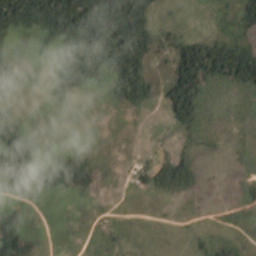

In [ ]:
Image.open((path/'test-jpg').ls()[5]).convert('RGB')